## Setup

In [1]:
!pip install -q transformers
!pip install -q sentencepiece
!pip install -q jiwer
!pip install -q datasets
!pip install -q evaluate
!pip install -q -U accelerate

!pip install -q matplotlib
!pip install -q protobuf==3.20.1
!pip install -q tensorboard
!pip install elementpath
!pip install scikit-learn
!pip install numpy==1.26.4


[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip


   ---------------------------------------- 15.8/15.8 MB 2.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.1
    Uninstalling numpy-1.26.1:
      Successfully uninstalled numpy-1.26.1


## Imports

In [6]:
import os
import torch
import evaluate
import numpy as np
import pandas as pd
import glob as glob
import torch.optim as optim
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

from PIL import Image
from zipfile import ZipFile
from tqdm.notebook import tqdm
from dataclasses import dataclass
from torch.utils.data import Dataset
from urllib.request import urlretrieve
from transformers import (
    VisionEncoderDecoderModel, 
    TrOCRProcessor,
    Seq2SeqTrainer,
    Seq2SeqTrainingArguments,
    default_data_collator
)

block_plot = False
plt.rcParams['figure.figsize'] = (12, 9)
bold = f"\033[1m"
reset = f"\033[0m"

In [5]:
def seed_everything(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Download and Extract the Dataset

In [6]:
# def download_and_unzip(url, save_path):
#     print(f"Downloading and extracting assets....", end="")

#     # Downloading zip file using urllib package.
#     urlretrieve(url, save_path)

#     try:
#         # Extracting zip file using the zipfile package.
#         with ZipFile(save_path) as z:
#             # Extract ZIP file contents in the same directory.
#             z.extractall(os.path.split(save_path)[0])

#         print("Done")

#     except Exception as e:
#         print("\nInvalid file.", e)

def download_and_unzip(save_path):
    # print(f"Downloading and extracting assets....", end="")

    # # Downloading zip file using urllib package.
    # urlretrieve(url, save_path)

    try:
        # Extracting zip file using the zipfile package.
        with ZipFile(save_path) as z:
            # Extract ZIP file contents in the same directory.
            z.extractall(os.path.split(save_path)[0])

        print("Done")

    except Exception as e:
        print("\nInvalid file.", e)

In [8]:
# image_dir = "C:/Users/dhlabadmin/Desktop/m-test/full-datasets/unpacked-datasets/6470048/Copy_of_HTR_Train_Set_Ukrainian_Printed_and_Handwritten_0_2a"
# xml_dir = "C:/Users/dhlabadmin/Desktop/m-test/full-datasets/unpacked-datasets/6470048/Copy_of_HTR_Train_Set_Ukrainian_Printed_and_Handwritten_0_2a/alto"
image_dir = "C:/Users/dhlabadmin/Desktop/m-test/Fine-Tuning-TrOCR/datasets/dataset_6470048/"
xml_dir = "C:/Users/dhlabadmin/Desktop/m-test/Fine-Tuning-TrOCR/datasets/dataset_6470048/alto"

In [7]:
# URL = r"https://www.dropbox.com/scl/fi/vyvr7jbdvu8o174mbqgde/scut_data.zip?rlkey=fs8axkpxunwu6if9a2su71kxs&dl=1"
# asset_zip_path = os.path.join(os.getcwd(), "dataset1.zip")
# # Download if asset ZIP does not exist.
# if not os.path.exists(asset_zip_path):
#     # download_and_unzip(URL, asset_zip_path)
#     print('Zip was not found')

## Training and Dataset Configurations

In [9]:
@dataclass(frozen=True)
class TrainingConfig:
    BATCH_SIZE:    int = 16
    EPOCHS:        int = 5
    LEARNING_RATE: float = 0.00005

@dataclass(frozen=True)
class DatasetConfig:
    DATA_ROOT:     str = image_dir

@dataclass(frozen=True)
class ModelConfig:
    MODEL_NAME: str = 'microsoft/trocr-base-handwritten'

```
dataset/
├── dataset_train
├── dataset_test
├── dataset_train.txt
└── dataset_test.txt
```

In [18]:
# def visualize(dataset_path):
#     plt.figure(figsize=(15, 3))
#     for i in range(15):
#         plt.subplot(3, 5, i+1)
#         all_images = os.listdir(f"{dataset_path}/dataset1_train")
#         image = plt.imread(f"{dataset_path}/dataset1_train/{all_images[i]}")
#         plt.imshow(image)
#         plt.axis('off')
#         plt.title(all_images[i].split('.')[0])
#     plt.show()

# visualize(DatasetConfig.DATA_ROOT)

In [10]:
from xml.etree import ElementTree as ET

def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    namespaces = {'alto': root.tag.split('}')[0].strip('{')}

    lines = []

    for string in root.findall(".//alto:String", namespaces):
        content = string.get("CONTENT")
        if content:
            lines.append(content)
    return " ".join(lines)

In [11]:
import os
import pandas as pd

def create_dataset(image_dir, xml_dir):
    data = []
    
    for image_file in os.listdir(image_dir):
        if image_file.endswith((".jpg", ".png", ".tif", "jpeg")):
            xml_file = os.path.splitext(image_file)[0] + ".xml"
            xml_path = os.path.join(xml_dir, xml_file)
            if os.path.exists(xml_path):
                text = parse_xml(xml_path)
                data.append({"file_name": image_file, "text": text})

    return pd.DataFrame(data)

## Prepare Dataset

In [12]:
from sklearn.model_selection import train_test_split

dataset = create_dataset(image_dir, xml_dir)
# print(dataset.info())

train_df, test_df = train_test_split(dataset, test_size=0.2, train_size=0.8, random_state=42)
# print("Before idx reset: ", train_df.shape, test_df.shape)

train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# print("After idx reset: ", train_df.shape, test_df.shape)

# Save text from images in a .txt
output_train = f"{image_dir}6470048_train.txt"
output_test = f"{image_dir}6470048_test.txt"
os.makedirs(os.path.dirname(output_train), exist_ok=True)
os.makedirs(os.path.dirname(output_test), exist_ok=True)

# Split train images and test images into 2 directories
train_destination = f"{image_dir}6470048_train/"
test_destination = f"{image_dir}6470048_test/"
os.makedirs(os.path.dirname(train_destination), exist_ok=True)
os.makedirs(os.path.dirname(test_destination), exist_ok=True)

with open(output_test, "w", encoding="utf-8") as f:
    for _, row in test_df.iterrows():
        f.write(f"{row['file_name']}\t{row['text']}\n")
        os.rename(image_dir + row['file_name'], test_destination + row['file_name'])

with open(output_train, "w", encoding="utf-8") as f:
    for _, row in train_df.iterrows():
        f.write(f"{row['file_name']}\t{row['text']}\n")
        os.rename(image_dir + row['file_name'], train_destination + row['file_name'])

In [61]:
# train_df = pd.read_fwf("datasets/dataset_6470048", header=None)
# train_df.rename(columns={0: 'file_name', 1: 'text'}, inplace=True)
# test_df = pd.read_fwf("datasets/dataset_6470048", header=None)
# test_df.rename(columns={0: 'file_name', 1: 'text'}, inplace=True)

In [13]:
train_df.head()

,file_name,text
0,Letters_Shwedowa_11_2022 (3)-0038.jpg,"Здрастуйте мої дорогі мама, папа, бабка, Окса..."
1,Letters_Shwedowa_11_2022-0019.jpg,українське приняття в залі. Славко наш був ста...
2,Luk'anenko_last_pages-0054.jpg,"як це небо, очі Пушкіна світились передо мною ..."
3,Ukrainka-0205.jpg,"Ой іду, иду, иду до коршомки пити, а за мною ч..."
4,p052.jpg,46 Василь Окунь-Бережанський: Коротеньку істор...


In [14]:
test_df.head()

,file_name,text
0,Moroz_Dudyk-0014.jpg,"минув тиждень. що буде, будуть знімати шви. Пі..."
1,p045.jpg,ви/мі́р/юва/ти ви́/мір/я/н/ий ви́/мір/я/ти ви́...
2,Letters_Shwedowa_11_2022-0049.jpg,"Ларисо, мила моя Ларисо, запам'ятай, самі голо..."
3,Luk'anenko_last_pages-0037.jpg,11го Жовтня. Хочеться хоч раз поглянути на себ...
4,Shev_Kobzar-0035.jpg,"Зарiсъ бошвого, дидучи Однаковісенько мині. Те..."


In [15]:
# Augmentations.
img_size = 1024

train_transforms = transforms.Compose([
    transforms.Resize((1024, 512)), # or transforms.Resize(img_size)
    transforms.ColorJitter(brightness=.5, hue=.3),
    transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
])

In [42]:
# from transformers import AutoTokenizer
# m = 'microsoft/trocr-base-handwritten'
# t = TrOCRProcessor.from_pretrained(m).tokenizer
# print(t.model_max_length)

512


In [129]:
class CustomOCRDataset(Dataset):
    def __init__(self, root_dir, df, processor, max_target_length=512):
        self.root_dir = root_dir
        self.df = df
        self.processor = processor
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        file_name = self.df['file_name'][idx]
        text = self.df['text'][idx]

        assert text.strip() != "", f"ERROR Empty text in {idx}"

        # Read the image, apply augmentations, and get the transformed pixels.
        image = Image.open(self.root_dir + file_name).convert('RGB')
        image = train_transforms(image)
        pixel_values = self.processor(image, return_tensors='pt').pixel_values
        # Pass the text through the tokenizer and get the labels,
        # i.e. tokenized labels.
        labels = self.processor.tokenizer(
            text,
            padding='max_length',
            # truncation=True,
            max_length=self.max_target_length,
            # return_tensors='pt'
        ).input_ids

        # input_ids = labels.clone()

        # print(f"Index {idx}, Tokenized labels: {labels}")

        # We are using -100 as the padding token.
        # labels = torch.where(labels == self.processor.tokenizer.pad_token_id, torch.tensor(-100), labels)
        # input_ids[input_ids == self.processor.tokenizer.pad_token_id] = -100
        labels = [label if label != self.processor.tokenizer.pad_token_id else -100 for label in labels]
        encoding = {"pixel_values": pixel_values.squeeze(0),
                    "labels": torch.tensor(labels)}
        # encoding = {"input_ids": labels, "pixel_values": pixel_values}
        # print(f"Index: {idx}, Labels shape: {torch.tensor(labels).shape}")
        # print(f"pixel_values: {torch.rand(3, 384, 384)}, labels: {torch.tensor(labels).squeeze()}")
        return encoding

In [130]:
processor = TrOCRProcessor.from_pretrained(ModelConfig.MODEL_NAME)
train_dataset = CustomOCRDataset(
    root_dir=os.path.join(DatasetConfig.DATA_ROOT, train_destination),
    df=train_df,
    processor=processor
)
valid_dataset = CustomOCRDataset(
    root_dir=os.path.join(DatasetConfig.DATA_ROOT, test_destination),
    df=test_df,
    processor=processor
)

In [18]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(valid_dataset))

Number of training examples: 596
Number of validation examples: 149


In [19]:
encoding = train_dataset[0]
for k,v in encoding.items():
    print(k, v.shape)

for i in range(5):
    img = Image.open(train_dataset.root_dir + train_df.iloc[i]['file_name'])
    print(f"Image {i} size {img.size}")

pixel_values torch.Size([3, 384, 384])
labels torch.Size([1024])
Image 0 size (2550, 3500)
Image 1 size (2552, 3510)
Image 2 size (6633, 9166)
Image 3 size (3399, 4166)
Image 4 size (2479, 3508)


(-0.5, 2549.5, 3499.5, -0.5)

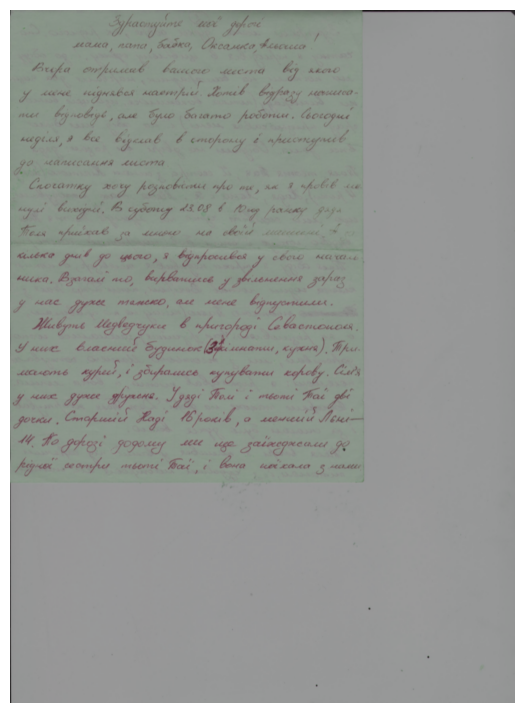

In [20]:
image = Image.open(train_dataset.root_dir + train_df['file_name'][0]).convert("RGB")
image = train_transforms(image)
plt.imshow(image)
plt.axis('off')

In [46]:
labels = encoding['labels']
labels[labels == -100] = processor.tokenizer.pad_token_id
label_str = processor.decode(labels, skip_special_tokens=True)
print(label_str)

Здрастуйте мої дорогі  мама, папа, бабка, Оксанка, Альоша!  Вчора отримав вашого листа від якого у мене піднявся настрій. Хотів відразу написа¬    ти відповідь, але було багато роботи. Сьогодні неділя, я все відклав в сторону і приступив  до написання листа. Спочатку хочу розповісти про те, як я провів ми нулі вихідні. В суботу 23.08 в 10 год ранку дядя Т  оля приїхав за мною на своїй машині. А за кілька днів до цього, я відпросився у свого началь¬  ника. Взагалі то, вирватись у звільнення зараз у нас дуже тяжко, але мене відпустили. Живуть Медведчуки в пригороді Севастополя. У них власний будинок (3 кімнати, кухня). Три¬ мають курей, і збирались купувати корову. Сім'я у них дуже дружня. У дяді Толі і тьоті Таї дві  дочки. Старшій Наді 16 років, а меншій Лєні - 14. По дорозі додому ми ще заїжджали до  рідної сестри тьоті Таї, і вона поїхала з нами.


## Initialize the Model

In [123]:
model = VisionEncoderDecoderModel.from_pretrained(ModelConfig.MODEL_NAME)
model.to(device)
# print(model)
# Total parameters and trainable parameters.
total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")
total_trainable_params = sum(
    p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "qkv_bias": false,
  "transformers_version": "4.48.1"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "gelu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "cross_attention_hidden_size": 768,
  "d_model": 1024,
  "decoder_attention_heads": 16,
  "decoder_ffn_dim": 4096,
  "decoder

333,921,792 total parameters.
333,921,792 training parameters.


## Model Configurations

In [114]:
additional_tokens = ["а", "б", "в", "г", "ґ", "д", "е", "є", "ж", "з", "и", "і", "ї", "й", "к", "л", "м", "н", "о", "п", "р", "с", "т", "у", "ф", "х", "ц", "ч", "ш", "щ", "ь", "ю", "я", "А", "Б", "В", "Г", "Ґ", "Д", "Е", "Є", "Ж", "З", "И", "І", "Ї", "Й", "К", "Л", "М", "Н", "О", "П", "Р", "С", "Т", "У", "Ф", "Х", "Ц", "Ч", "Ш", "Щ", "Ь", "Ю", "Я"]

num_added_tokens = processor.tokenizer.add_tokens(additional_tokens)
if num_added_tokens > 0:
    model.decoder.resize_token_embeddings(len(processor.tokenizer))
# print(processor.tokenizer.cls_token)
# print(processor.tokenizer.sep_token)
# print(processor.tokenizer.pad_token)
# print("Length of Tokenizer: ", len(processor.tokenizer))

# test_text = 'привет,Ґї'
# tokens = processor.tokenizer.tokenize(test_text)
# print('Tokens: ', tokens)

In [115]:
# Set special tokens used for creating the decoder_input_ids from the labels.
model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
# Set Correct vocab size.
# model.config.vocab_size = model.config.decoder.vocab_size
model.config.vocab_size = len(processor.tokenizer)
model.config.eos_token_id = processor.tokenizer.sep_token_id

model.config.max_length = 64
model.config.early_stopping = True
model.config.no_repeat_ngram_size = 3
model.config.length_penalty = 2.0
model.config.num_beams = 4

We use the AdamW optimizer here with a weight decay of 0.0005.

In [73]:
optimizer = optim.AdamW(
    model.parameters(), lr=TrainingConfig.LEARNING_RATE, weight_decay=0.0005
)

## Evaluation Metric

In [74]:
cer_metric = evaluate.load('cer')

In [75]:
def compute_cer(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)

    cer = cer_metric.compute(predictions=pred_str, references=label_str)

    return {"cer": cer}

## Training and Validation Loops

In [131]:
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    evaluation_strategy='epoch',
    per_device_train_batch_size=TrainingConfig.BATCH_SIZE,
    per_device_eval_batch_size=TrainingConfig.BATCH_SIZE,
    fp16=True,
    output_dir='seq2seq_model_printed/',
    logging_strategy='epoch',
    save_strategy='epoch',
    save_total_limit=5,
    report_to='tensorboard',
    num_train_epochs=TrainingConfig.EPOCHS
)

In [132]:
# from transformers import DataCollatorForSeq2Seq
def collate_fn(batch):
    batch = list(filter(lambda x: x is not None, batch))

    # Pack pixel vals und labels separately in lists
    pixel_values = [item['pixel_values'] for item in batch]
    labels = [item['labels'] for item in batch]

    # Convert lists to tensors + padding
    pixel_values = torch.stack(pixel_values)
    labels = torch.nn.utils.rnn.pad_sequence(labels, batch_first=True, padding_value=-100)

    return {
        "pixel_values": pixel_values,
        "labels": labels
    }

# Initialize trainer.
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.feature_extractor,
    args=training_args,
    compute_metrics=compute_cer,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    data_collator=collate_fn
    # data_collator=default_data_collator
    # data_collator=DataCollatorForSeq2Seq(tokenizer=processor.tokenizer, model=model, padding=True)
)

C:\Users\dhlabadmin\AppData\Local\Temp\ipykernel_12700\2752172646.py:4: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


## Train

In [133]:
res = trainer.train()

RuntimeError: stack expects each tensor to be equal size, but got [1067] at entry 0 and [693] at entry 1

In [106]:
res

NameError: name 'res' is not defined

## Inference

In [31]:
device = torch.device('cuda:0' if torch.cuda.is_available else 'cpu')

In [32]:
processor = TrOCRProcessor.from_pretrained(ModelConfig.MODEL_NAME)
trained_model = VisionEncoderDecoderModel.from_pretrained('seq2seq_model_printed/checkpoint-'+str(res.global_step)).to(device)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


In [33]:
def read_and_show(image_path):
    """
    :param image_path: String, path to the input image.

    Returns:
        image: PIL Image.
    """
    image = Image.open(image_path).convert('RGB')
    return image

In [34]:
def ocr(image, processor, model):
    """
    :param image: PIL Image.
    :param processor: Huggingface OCR processor.
    :param model: Huggingface OCR model.

    Returns:
        generated_text: the OCR'd text string.
    """
    # We can directly perform OCR on cropped images.
    pixel_values = processor(image, return_tensors='pt').pixel_values.to(device)
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text

In [35]:
def eval_new_data(
    data_path=os.path.join(DatasetConfig.DATA_ROOT, 'dataset1_test', '*'),
    num_samples=50
):
    image_paths = glob.glob(data_path)
    for i, image_path in tqdm(enumerate(image_paths), total=len(image_paths)):
        if i == num_samples:
            break
        image = read_and_show(image_path)
        text = ocr(image, processor, trained_model)
        plt.figure(figsize=(7, 4))
        plt.imshow(image)
        plt.title(text)
        plt.axis('off')
        plt.show()

  0%|          | 0/1651 [00:00<?, ?it/s]

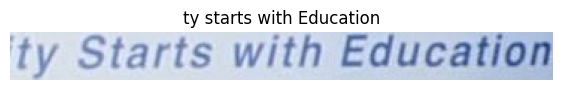

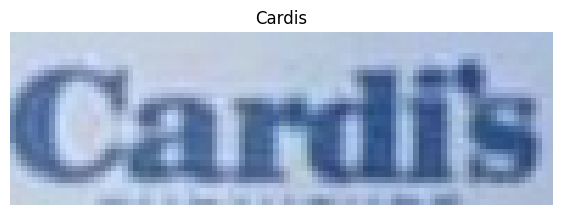

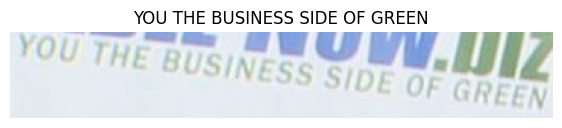

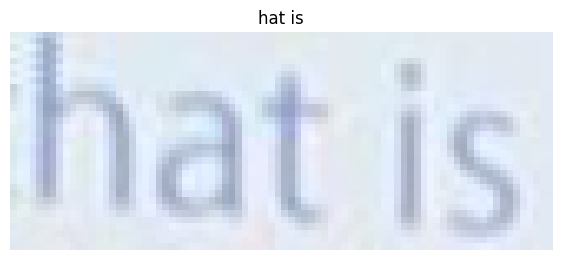

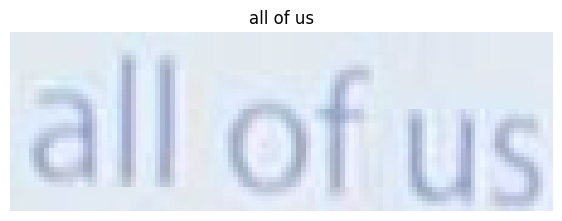

...

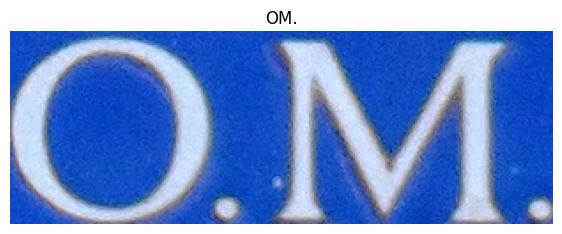

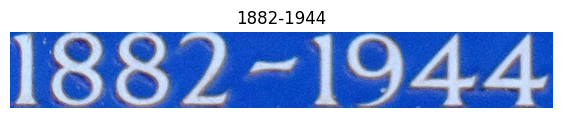

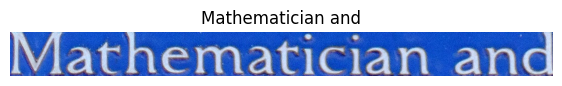

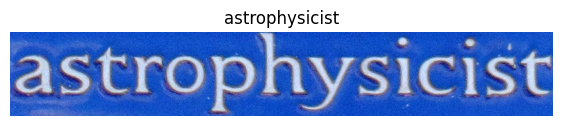

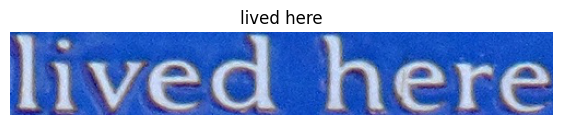

In [36]:
eval_new_data(
    data_path=os.path.join(DatasetConfig.DATA_ROOT, 'scut_test', '*'),
    num_samples=100
)